In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import scipy.stats as stats
import pandas_profiling   #need to install using anaconda prompt (pip install pandas_profiling)

%matplotlib inline
plt.rcParams['figure.figsize'] = 10, 7.5
plt.rcParams['axes.grid'] = True

from matplotlib.backends.backend_pdf import PdfPages

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv('telco_csv.csv')
df.head()

,region,tenure,age,marital,address,income,ed,employ,retire,gender,...,callwait,forward,confer,longmon,tollmon,equipmon,cardmon,wiremon,ebill,custcat
0,2,13,44,1,9,64,4,5,0,0,...,0,1,0,3.70,0.00,0.0,7.50,0.0,0,1
1,3,11,33,1,7,136,5,5,0,0,...,1,1,1,4.40,20.75,0.0,15.25,35.7,0,4
2,3,68,52,1,24,116,1,29,0,1,...,1,0,1,18.15,18.00,0.0,30.25,0.0,0,3
3,2,33,33,0,12,33,2,0,0,1,...,0,0,0,9.45,0.00,0.0,0.00,0.0,0,1
4,2,23,30,1,9,30,1,2,0,0,...,0,1,1,6.30,0.00,0.0,0.00,0.0,0,3


In [3]:
df_new = pd.get_dummies(df,columns=['region','custcat'],drop_first=True) #One-Hot encoding
df_new.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,tollmon,equipmon,cardmon,wiremon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,13,44,1,9,64,4,5,0,0,2,...,0.00,0.0,7.50,0.0,0,1,0,0,0,0
1,11,33,1,7,136,5,5,0,0,6,...,20.75,0.0,15.25,35.7,0,0,1,0,0,1
2,68,52,1,24,116,1,29,0,1,2,...,18.00,0.0,30.25,0.0,0,0,1,0,1,0
3,33,33,0,12,33,2,0,0,1,1,...,0.00,0.0,0.00,0.0,0,1,0,0,0,0
4,23,30,1,9,30,1,2,0,0,4,...,0.00,0.0,0.00,0.0,0,1,0,0,1,0


In [4]:
#Handling outliers...
def outlier_capping(x):
    x = x.clip(upper = x.quantile(0.99))
    x = x.clip(lower = x.quantile(0.01))
    return x

df_new = df_new.apply(lambda x: outlier_capping(x))
df_new.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,tollmon,equipmon,cardmon,wiremon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,13,44.0,1,9,64.0,4,5.0,0,0,2,...,0.00,0.0,7.50,0.0,0,1,0,0,0,0
1,11,33.0,1,7,136.0,5,5.0,0,0,6,...,20.75,0.0,15.25,35.7,0,0,1,0,0,1
2,68,52.0,1,24,116.0,1,29.0,0,1,2,...,18.00,0.0,30.25,0.0,0,0,1,0,1,0
3,33,33.0,0,12,33.0,2,0.0,0,1,1,...,0.00,0.0,0.00,0.0,0,1,0,0,0,0
4,23,30.0,1,9,30.0,1,2.0,0,0,4,...,0.00,0.0,0.00,0.0,0,1,0,0,1,0


In [5]:
#Handling missing
def Missing_Imputation(x):
    x = x.fillna(x.median())
    return x

df_new = df_new.apply(lambda x: Missing_Imputation(x))
df_new.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,tollmon,equipmon,cardmon,wiremon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,13,44.0,1,9,64.0,4,5.0,0,0,2,...,0.00,0.0,7.50,0.0,0,1,0,0,0,0
1,11,33.0,1,7,136.0,5,5.0,0,0,6,...,20.75,0.0,15.25,35.7,0,0,1,0,0,1
2,68,52.0,1,24,116.0,1,29.0,0,1,2,...,18.00,0.0,30.25,0.0,0,0,1,0,1,0
3,33,33.0,0,12,33.0,2,0.0,0,1,1,...,0.00,0.0,0.00,0.0,0,1,0,0,0,0
4,23,30.0,1,9,30.0,1,2.0,0,0,4,...,0.00,0.0,0.00,0.0,0,1,0,0,1,0


In [6]:
df_new.columns

Index(['tenure', 'age', 'marital', 'address', 'income', 'ed', 'employ',
       'retire', 'gender', 'reside', 'tollfree', 'equip', 'callcard',
       'wireless', 'multline', 'voice', 'pager', 'internet', 'callid',
       'callwait', 'forward', 'confer', 'longmon', 'tollmon', 'equipmon',
       'cardmon', 'wiremon', 'ebill', 'region_2', 'region_3', 'custcat_2',
       'custcat_3', 'custcat_4'],
      dtype='object')

In [7]:
pandas_profiling.ProfileReport(df_new)

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
df_new.drop(['wiremon','equipmon'],axis=1,inplace=True) #Dropping these 2 columns based on above profiling report - stating high collinearity
df_new.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,confer,longmon,tollmon,cardmon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,13,44.0,1,9,64.0,4,5.0,0,0,2,...,0,3.70,0.00,7.50,0,1,0,0,0,0
1,11,33.0,1,7,136.0,5,5.0,0,0,6,...,1,4.40,20.75,15.25,0,0,1,0,0,1
2,68,52.0,1,24,116.0,1,29.0,0,1,2,...,1,18.15,18.00,30.25,0,0,1,0,1,0
3,33,33.0,0,12,33.0,2,0.0,0,1,1,...,0,9.45,0.00,0.00,0,1,0,0,0,0
4,23,30.0,1,9,30.0,1,2.0,0,0,4,...,1,6.30,0.00,0.00,0,1,0,0,1,0


In [9]:
#Standardization
sc = StandardScaler()
df_model = sc.fit(df_new)
df_model = sc.transform(df_new)

df_model

array([[-1.055125  ,  0.18944573,  1.0100505 , ..., -0.52644013,
        -0.62515645, -0.5557882 ],
       [-1.14880563, -0.69547638,  1.0100505 , ..., -0.52644013,
        -0.62515645,  1.79924655],
       [ 1.52109247,  0.83302545,  1.0100505 , ..., -0.52644013,
         1.59959959, -0.5557882 ],
       ...,
       [ 1.47425216,  1.39615771, -0.9900495 , ..., -0.52644013,
        -0.62515645,  1.79924655],
       [ 1.61477311,  0.59168306, -0.9900495 , ..., -0.52644013,
         1.59959959, -0.5557882 ],
       [ 0.67796676, -0.45413398,  1.0100505 , ...,  1.89955124,
        -0.62515645, -0.5557882 ]])

In [10]:
df_scaled = pd.DataFrame(df_model,columns= df_new.columns)
df_scaled

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,confer,longmon,tollmon,cardmon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,-1.055125,0.189446,1.010051,-0.252674,-0.126231,1.087753,-0.597197,-0.222076,-1.034598,-0.229045,...,-1.004008,-0.835868,-0.824695,-0.457615,-0.768001,1.412095,-0.724148,-0.526440,-0.625156,-0.555788
1,-1.148806,-0.695476,1.010051,-0.453208,0.802534,1.906227,-0.597197,-0.222076,-1.034598,2.607427,...,0.996008,-0.761419,0.484856,0.121006,-0.768001,-0.708168,1.380933,-0.526440,-0.625156,1.799247
2,1.521092,0.833025,1.010051,1.251336,0.544543,-1.367671,1.811218,-0.222076,0.966559,-0.229045,...,0.996008,0.700982,0.311301,1.240918,-0.768001,-0.708168,1.380933,-0.526440,1.599600,-0.555788
3,-0.118319,-0.695476,-0.990050,0.048128,-0.526115,-0.549196,-1.098950,-0.222076,0.966559,-0.938163,...,-1.004008,-0.224319,-0.824695,-1.017571,-0.768001,1.412095,-0.724148,-0.526440,-0.625156,-0.555788
4,-0.586722,-0.936819,1.010051,-0.252674,-0.564814,-1.367671,-0.898249,-0.222076,-1.034598,1.189191,...,0.996008,-0.559342,-0.824695,-1.017571,-0.768001,1.412095,-0.724148,-0.526440,1.599600,-0.555788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-1.195646,-0.212792,-0.990050,-1.155079,-0.603512,0.269278,-1.098950,-0.222076,0.966559,0.480073,...,-1.004008,-0.910318,-0.824695,-1.017571,1.302082,-0.708168,1.380933,-0.526440,-0.625156,-0.555788
996,-1.336167,-0.615029,-0.990050,-0.954544,-0.668010,1.906227,-0.597197,-0.222076,0.966559,-0.938163,...,-1.004008,-0.734830,-0.824695,-1.017571,-0.768001,-0.708168,-0.724148,-0.526440,-0.625156,-0.555788
997,1.474252,1.396158,-0.990050,2.855612,4.988164,1.906227,2.212621,-0.222076,0.966559,-0.938163,...,0.996008,1.615647,1.194853,1.651553,1.302082,-0.708168,1.380933,-0.526440,-0.625156,1.799247
998,1.614773,0.591683,-0.990050,0.649732,0.170458,-0.549196,1.108764,-0.222076,0.966559,-0.938163,...,0.996008,1.493337,1.289519,0.867614,-0.768001,-0.708168,1.380933,-0.526440,1.599600,-0.555788


In [11]:
df_scaled.count()

tenure       1000
age          1000
marital      1000
address      1000
income       1000
ed           1000
employ       1000
retire       1000
gender       1000
reside       1000
tollfree     1000
equip        1000
callcard     1000
wireless     1000
multline     1000
voice        1000
pager        1000
internet     1000
callid       1000
callwait     1000
forward      1000
confer       1000
longmon      1000
tollmon      1000
cardmon      1000
ebill        1000
region_2     1000
region_3     1000
custcat_2    1000
custcat_3    1000
custcat_4    1000
dtype: int64

In [12]:
#PCA
pca_model = PCA(n_components= df_scaled.shape[1]) #Creating no. of components
pca_model

PCA(n_components=31)

In [13]:
pca_model = pca_model.fit(df_scaled) #Fitting data to the PCA object
pca_model

PCA(n_components=31)

In [14]:
#Eigen values =  explained_variance_
pca_model.explained_variance_

array([6.63193453, 4.80119633, 3.28047735, 1.83818168, 1.53177751,
       1.22768157, 1.16294345, 1.06005561, 0.99253038, 0.81365295,
       0.65699425, 0.6296238 , 0.62716816, 0.57056826, 0.48852538,
       0.47474471, 0.43216881, 0.41708854, 0.40880292, 0.3809091 ,
       0.35684632, 0.34469116, 0.32367572, 0.29606635, 0.26701316,
       0.23220096, 0.21710558, 0.19765917, 0.18785995, 0.11328944,
       0.06759793])

In [15]:
pca_model.explained_variance_ratio_ ##PCAn/33.... e.g. 7.375/33, 5.3/33 etc.

array([0.21371944, 0.15472242, 0.10571603, 0.05923689, 0.04936277,
       0.03956303, 0.03747679, 0.03416115, 0.03198509, 0.02622062,
       0.02117217, 0.02029013, 0.020211  , 0.01838702, 0.01574312,
       0.01529903, 0.01392699, 0.01344101, 0.013174  , 0.0122751 ,
       0.01149966, 0.01110795, 0.01043071, 0.00954098, 0.00860471,
       0.00748286, 0.0069964 , 0.00636973, 0.00605394, 0.00365084,
       0.0021784 ])

In [16]:
pca_model.explained_variance_ratio_.cumsum() #Cumulative sum of explained_variance_ratio_

array([0.21371944, 0.36844186, 0.47415789, 0.53339478, 0.58275754,
       0.62232057, 0.65979736, 0.69395851, 0.7259436 , 0.75216422,
       0.77333639, 0.79362653, 0.81383753, 0.83222455, 0.84796767,
       0.86326671, 0.87719369, 0.89063471, 0.90380871, 0.91608381,
       0.92758348, 0.93869143, 0.94912214, 0.95866311, 0.96726783,
       0.97475069, 0.98174709, 0.98811682, 0.99417076, 0.9978216 ,
       1.        ])

In [17]:
np.cumsum(pca_model.explained_variance_ratio_) #Another way of finding cumulative sum

array([0.21371944, 0.36844186, 0.47415789, 0.53339478, 0.58275754,
       0.62232057, 0.65979736, 0.69395851, 0.7259436 , 0.75216422,
       0.77333639, 0.79362653, 0.81383753, 0.83222455, 0.84796767,
       0.86326671, 0.87719369, 0.89063471, 0.90380871, 0.91608381,
       0.92758348, 0.93869143, 0.94912214, 0.95866311, 0.96726783,
       0.97475069, 0.98174709, 0.98811682, 0.99417076, 0.9978216 ,
       1.        ])

# Dimension Reduction...

In [18]:
#Based on the cum_proportion and individual eigenvalues, we can decide the no. of components

#Selecting top 10 components
pca_model = PCA(n_components=10)
pca_model = pca_model.fit(df_scaled)

In [19]:
#Eigen values =  explained_variance_
display(pca_model.explained_variance_)

display(pca_model.explained_variance_ratio_)

display(pca_model.explained_variance_ratio_.cumsum())

array([6.63193453, 4.80119633, 3.28047734, 1.83818134, 1.53177471,
       1.22766878, 1.1629325 , 1.0599334 , 0.99246794, 0.81349877])

array([0.21371944, 0.15472242, 0.10571603, 0.05923688, 0.04936268,
       0.03956262, 0.03747644, 0.03415721, 0.03198308, 0.02621565])

array([0.21371944, 0.36844186, 0.47415789, 0.53339477, 0.58275744,
       0.62232006, 0.6597965 , 0.6939537 , 0.72593678, 0.75215244])

In [20]:
#We can't see the pca_model data directly. For that we need to apply transform function.
PC_output = pd.DataFrame(pca_model.transform(df_scaled),columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10' ])

#To format & display the data well, putting them in a dataframe
#Also, giving names to the columns
PC_output


#PC_output - can be used for model-building (Regression/Classification/Segmentation any model-building here).
#This is also called as dimension - reduction
#So, instead of using 33 variables, we can use these 10 variables 

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
0,-2.038044,0.182337,-1.016710,0.320943,1.491155,0.475599,0.472309,-1.219852,0.530823,0.996246
1,3.100690,-2.318888,-1.739687,1.746828,-1.287535,1.772459,0.773104,-1.013130,0.595181,-0.628269
2,1.681549,3.945677,-0.426500,0.493515,-1.594663,0.844249,-0.144974,0.156747,-0.720015,0.564592
3,-3.371286,0.358316,-1.069909,-1.073571,1.497541,0.011641,0.493725,-0.026946,-1.268693,-0.917258
4,-1.439218,0.667524,-3.138833,1.414955,1.581910,0.326102,0.012223,0.343006,1.257948,0.284287
...,...,...,...,...,...,...,...,...,...,...
995,-3.471284,-1.797754,-0.886391,-0.956878,-1.449535,0.519954,0.438928,0.614108,-0.496997,0.321258
996,-3.423070,-1.428016,-0.915457,-1.489571,-0.001275,0.262801,-0.285852,0.529958,-0.684251,0.381127
997,5.954218,0.035077,4.469907,-2.565230,-1.339172,2.917833,-1.579600,-0.371459,-0.671250,0.501421
998,2.851873,3.101604,-0.777704,-0.813836,-1.747623,-0.442646,-0.727679,0.083834,-1.048693,-0.099072


# Feature Reduction...

In [21]:
#We don't want dimension reduction, rather want the variable reduction
#& for variable reduction - we need factor loadings

# Loading Matrix

Loadings = EigenVectors * sqrt(EigenValues)

Loadings are the covariances/correlations between the original variables and the unit-scaled components

In [22]:
#Variable reduction using 'Factor loadings'
Loadings =  pd.DataFrame((pca_model.components_.T * np.sqrt(pca_model.explained_variance_)).T,columns=df_scaled.columns).T
#Preferred way  - using 'Factor analysis'
#components_: PC components
#explained_variance_: EigenValues

Loadings.columns= ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10' ]
Loadings.to_csv('Practice_Telecom_Segmentation_Loadings.csv')
Loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
tenure,0.316075,0.545128,0.563350,0.211099,-0.020939,-0.088909,-0.056415,-0.052491,-0.032106,-0.087447
age,0.275742,0.580311,0.420737,-0.288442,0.032809,0.200327,0.188266,0.097547,0.163111,0.125180
marital,0.074466,-0.006104,0.067097,0.798413,-0.014680,0.311718,0.173020,0.141897,0.162364,0.142239
address,0.233096,0.531098,0.428913,-0.178197,0.025000,0.044347,0.161132,0.073473,0.132027,0.047151
income,0.329303,0.235827,0.293549,-0.194388,0.027032,0.628710,-0.406981,-0.141567,-0.043607,0.048774
ed,0.117634,-0.555726,0.288437,-0.063881,-0.033790,0.035732,-0.276833,0.124173,0.097999,0.212983
employ,0.328228,0.597249,0.351851,-0.176762,0.043151,0.402577,-0.046238,0.024030,0.022565,0.010027
retire,0.106412,0.333475,0.152259,-0.240704,0.032407,-0.218555,0.556040,0.461827,0.149158,0.064224
gender,-0.010103,0.013355,0.047963,0.002266,-0.081067,0.136368,-0.002575,0.524616,-0.823657,0.057623
reside,0.019203,-0.172673,-0.092469,0.812842,0.004774,0.272171,0.136786,0.128430,0.084517,0.044555


In [24]:
list_pca = ['region_2','region_3','tollfree','custcat_2','longmon','wireless','address','marital','tenure','income']

In [25]:
df_final = df_scaled[list_pca]
df_final

#df_final: Input to the K-Means clustering

,region_2,region_3,age,custcat_2,longmon,wireless,address,marital,tenure,income
0,1.412095,-0.724148,0.189446,-0.526440,-0.835868,-0.648425,-0.252674,1.010051,-1.055125,-0.126231
1,-0.708168,1.380933,-0.695476,-0.526440,-0.761419,1.542199,-0.453208,1.010051,-1.148806,0.802534
2,-0.708168,1.380933,0.833025,-0.526440,0.700982,-0.648425,1.251336,1.010051,1.521092,0.544543
3,1.412095,-0.724148,-0.695476,-0.526440,-0.224319,-0.648425,0.048128,-0.990050,-0.118319,-0.526115
4,1.412095,-0.724148,-0.936819,-0.526440,-0.559342,-0.648425,-0.252674,1.010051,-0.586722,-0.564814
...,...,...,...,...,...,...,...,...,...,...
995,-0.708168,1.380933,-0.212792,-0.526440,-0.910318,-0.648425,-1.155079,-0.990050,-1.195646,-0.603512
996,-0.708168,-0.724148,-0.615029,-0.526440,-0.734830,-0.648425,-0.954544,-0.990050,-1.336167,-0.668010
997,-0.708168,1.380933,1.396158,-0.526440,1.615647,1.542199,2.855612,-0.990050,1.474252,4.988164
998,-0.708168,1.380933,0.591683,-0.526440,1.493337,-0.648425,0.649732,-0.990050,1.614773,0.170458


# Silhouette Score using K-Means Clustering...

In [26]:
#Will use K-Means clustering to build K-Means Segmentation
km3 = KMeans(n_clusters=3,random_state=123)
km3.fit(df_final)

##km3 is the segmentation output

KMeans(n_clusters=3, random_state=123)

In [28]:
#3 outputs:
# 1. Centroids
# 2. Labels - which segment it belongs too
# 3. 
km3.labels_ #Output here is in 3 groups - 0/1/2. 0 - 1st segment, 1 - 2nd segment, 2 - 3rd segment

#Each array item denotes the categorization of obseravtions in previous line 32 
##[1000 array items == 1000 observation in telco_final

array([0, 1, 2, 0, 0, 0, 1, 0, 1, 2, 0, 1, 1, 2, 0, 1, 2, 1, 0, 1, 1, 2,
       1, 2, 1, 0, 0, 1, 1, 0, 1, 2, 2, 1, 2, 1, 2, 1, 1, 2, 1, 0, 0, 1,
       2, 1, 2, 1, 1, 1, 0, 2, 1, 1, 1, 0, 1, 2, 0, 2, 0, 0, 1, 2, 0, 1,
       1, 2, 1, 1, 1, 1, 1, 0, 2, 1, 1, 2, 2, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       0, 2, 1, 0, 1, 1, 1, 0, 2, 1, 0, 2, 1, 1, 0, 1, 0, 0, 2, 1, 1, 2,
       2, 0, 0, 0, 1, 1, 1, 1, 2, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 2, 2, 0,
       2, 2, 0, 1, 0, 0, 1, 1, 1, 1, 1, 2, 1, 1, 0, 1, 1, 1, 0, 2, 2, 2,
       2, 1, 0, 0, 1, 1, 1, 2, 2, 1, 2, 2, 1, 1, 1, 2, 0, 1, 2, 0, 2, 1,
       2, 1, 1, 1, 0, 0, 1, 2, 2, 1, 1, 1, 1, 1, 0, 1, 1, 2, 1, 1, 0, 2,
       1, 2, 1, 1, 1, 2, 1, 0, 2, 1, 2, 1, 1, 1, 1, 0, 0, 2, 0, 1, 2, 2,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 2, 1, 1, 2, 0, 1, 2, 0, 0, 1, 2, 1, 2,
       2, 1, 1, 1, 0, 1, 1, 0, 1, 0, 2, 2, 1, 0, 0, 1, 0, 1, 2, 0, 0, 2,
       0, 1, 1, 0, 1, 0, 0, 2, 2, 2, 1, 2, 2, 2, 0, 1, 1, 0, 1, 2, 1, 0,
       1, 2, 0, 0, 1, 2, 1, 1, 0, 2, 0, 1, 1, 0, 2,

In [29]:
km3.cluster_centers_ #3 segments means 3 centroids

#1st segment: [1.41209489, -0.72414794, -0.27078548, -0.0750929 , -0.39147998, 0.08178329, -0.3129116 , -0.13729369, -0.35197558, -0.18408043]
#2nd segment: [-0.70816771,  0.38449825, -0.40198893, -0.07641614, -0.41687176, -0.02253213, -0.45769763,  0.02919123, -0.46907172, -0.27332405]
#3rd segment: [-0.11791145,  0.02381132,  0.94650353,  0.20224593,  1.0861344 , -0.03858066,  1.08201971,  0.07960105,  1.13847743,  0.64352283]


##These are the values of each segment values for each observation & columns

array([[ 1.41209489, -0.72414794, -0.27078548, -0.0750929 , -0.39147998,
         0.08178329, -0.3129116 , -0.13729369, -0.35197558, -0.18408043],
       [-0.70816771,  0.38449825, -0.40198893, -0.07641614, -0.41687176,
        -0.02253213, -0.45769763,  0.02919123, -0.46907172, -0.27332405],
       [-0.11791145,  0.02381132,  0.94650353,  0.20224593,  1.0861344 ,
        -0.03858066,  1.08201971,  0.07960105,  1.13847743,  0.64352283]])

In [30]:
#We understood for given k value, how to calculate k-means

In [32]:
metrics.silhouette_score(df_final,km3.labels_) #df_final: x,labels_: labels 

<IPython.core.display.Javascript object>

0.15690011051637429

In [38]:
#Now trying the same for more clusters to get best SC score - that will help to decide best no. of categories

k_range = range(3,8)
sc_scores = []
for i in k_range:
    km = KMeans(n_clusters=i,random_state=123)
    km = km.fit(df_final)
    sc_scores.append(silhouette_score(df_final, km.labels_))
    print("nclusters=",i,', SC-score=',metrics.silhouette_score(df_final,km.labels_))

<IPython.core.display.Javascript object>

nclusters= 3 , SC-score= 0.15690011051637429


<IPython.core.display.Javascript object>

nclusters= 4 , SC-score= 0.1636109676935812


<IPython.core.display.Javascript object>

nclusters= 5 , SC-score= 0.16719903434704628


<IPython.core.display.Javascript object>

nclusters= 6 , SC-score= 0.14627423622001764


<IPython.core.display.Javascript object>

nclusters= 7 , SC-score= 0.15897054461927512


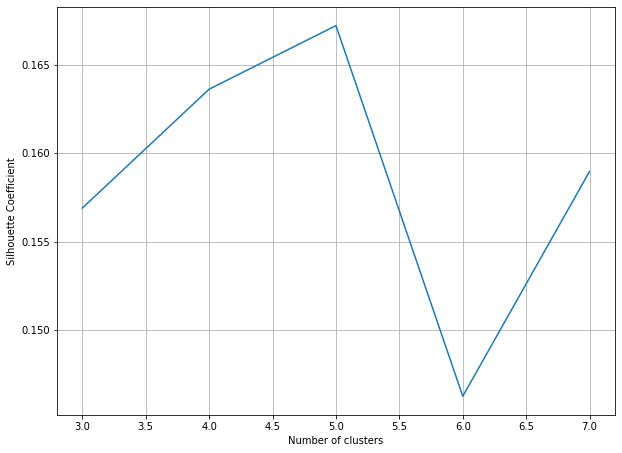

In [40]:
# Plotting the results...

plt.plot(k_range, sc_scores)
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Coefficient')
plt.grid(True)

In [41]:
#Based on sc score, the solution is K=5, the second solution can be k=4
#We selected no. of cluster=5, according to SC score.

# Profiling

In [43]:
#Now will use profiling to select no. of clusters as below...

 ## Profiling - we do on Labels, and not on stanadarsied lABELS
km3 = KMeans(n_clusters=3,random_state=123).fit(df_new)
km4 = KMeans(n_clusters=4,random_state=123).fit(df_new)
km5 = KMeans(n_clusters=5,random_state=123).fit(df_new)
km6 = KMeans(n_clusters=6,random_state=123).fit(df_new)
km7 = KMeans(n_clusters=7,random_state=123).fit(df_new)
km8 = KMeans(n_clusters=8,random_state=123).fit(df_new)

#Labels 
df_new['km3'] = km3.labels_
df_new['km4'] = km4.labels_
df_new['km5'] = km5.labels_
df_new['km6'] = km6.labels_
df_new['km7'] = km7.labels_
df_new['km8'] = km8.labels_

df_new.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,region_3,custcat_2,custcat_3,custcat_4,km3,km4,km5,km6,km7,km8
0,13,44.0,1,9,64.0,4,5.0,0,0,2,...,0,0,0,0,2,2,2,0,0,0
1,11,33.0,1,7,136.0,5,5.0,0,0,6,...,1,0,0,1,0,0,0,2,2,3
2,68,52.0,1,24,116.0,1,29.0,0,1,2,...,1,0,1,0,0,0,0,2,2,7
3,33,33.0,0,12,33.0,2,0.0,0,1,1,...,0,0,0,0,2,2,2,0,0,4
4,23,30.0,1,9,30.0,1,2.0,0,0,4,...,0,0,1,0,2,2,2,0,0,4


In [47]:
display(pd.Series.sort_index(df_new.km3.value_counts()/sum(df_new.km3.value_counts())))
display(pd.Series.sort_index(df_new.km4.value_counts()/sum(df_new.km4.value_counts())))
display(pd.Series.sort_index(df_new.km5.value_counts()/sum(df_new.km5.value_counts())))
display(pd.Series.sort_index(df_new.km6.value_counts()/sum(df_new.km6.value_counts())))
display(pd.Series.sort_index(df_new.km7.value_counts()/sum(df_new.km7.value_counts())))
display(pd.Series.sort_index(df_new.km8.value_counts()/sum(df_new.km8.value_counts())))

0    0.210
1    0.049
2    0.741
Name: km3, dtype: float64

0    0.265
1    0.028
2    0.622
3    0.085
Name: km4, dtype: float64

0    0.178
1    0.027
2    0.457
3    0.267
4    0.071
Name: km5, dtype: float64

0    0.453
1    0.017
2    0.170
3    0.033
4    0.256
5    0.071
Name: km6, dtype: float64

0    0.399
1    0.032
2    0.140
3    0.019
4    0.201
5    0.139
6    0.070
Name: km7, dtype: float64

0    0.174
1    0.027
2    0.203
3    0.095
4    0.295
5    0.061
6    0.017
7    0.128
Name: km8, dtype: float64

In [48]:
size=pd.concat([pd.Series(df_new.km3.size), pd.Series.sort_index(df_new.km3.value_counts()), pd.Series.sort_index(df_new.km4.value_counts()),
           pd.Series.sort_index(df_new.km5.value_counts()), pd.Series.sort_index(df_new.km6.value_counts()),
           pd.Series.sort_index(df_new.km7.value_counts()), pd.Series.sort_index(df_new.km8.value_counts())])

#1000: Overall observation
#210,49... Segment wise observation


##Concatenated overall (1000) + individual segment(210,49...) % with their segment group(0,1,2)

size

0    1000
0     210
1      49
2     741
0     265
1      28
2     622
3      85
0     178
1      27
2     457
3     267
4      71
0     453
1      17
2     170
3      33
4     256
5      71
0     399
1      32
2     140
3      19
4     201
5     139
6      70
0     174
1      27
2     203
3      95
4     295
5      61
6      17
7     128
dtype: int64

In [53]:
prop = size*100/df_new.km3.size
prop #%Percentage wise observation

0    100.0
0     21.0
1      4.9
2     74.1
0     26.5
1      2.8
2     62.2
3      8.5
0     17.8
1      2.7
2     45.7
3     26.7
4      7.1
0     45.3
1      1.7
2     17.0
3      3.3
4     25.6
5      7.1
0     39.9
1      3.2
2     14.0
3      1.9
4     20.1
5     13.9
6      7.0
0     17.4
1      2.7
2     20.3
3      9.5
4     29.5
5      6.1
6      1.7
7     12.8
dtype: float64

In [51]:
Seg_size=pd.DataFrame(size, columns=['Seg_size'])
Seg_Pct = pd.DataFrame(size/df_new.km3.size, columns=['Seg_Pct'])

pd.concat([Seg_size.T, Seg_Pct.T], axis=0)

,0,0,1,2,0,1,2,3,0,1,...,5,6,0,1,2,3,4,5,6,7
Seg_size,1000.0,210.00,49.000,741.000,265.000,28.000,622.000,85.000,178.000,27.000,...,139.000,70.00,174.000,27.000,203.000,95.000,295.000,61.000,17.000,128.000
Seg_Pct,1.0,0.21,0.049,0.741,0.265,0.028,0.622,0.085,0.178,0.027,...,0.139,0.07,0.174,0.027,0.203,0.095,0.295,0.061,0.017,0.128


In [54]:
# Mean value gives a good indication of the distribution of data. So we are finding mean value for each variable for each cluster
Profling_output = pd.concat([df_new.apply(lambda x: x.mean()).T, df_new.groupby('km3').apply(lambda x: x.mean()).T, df_new.groupby('km4').apply(lambda x: x.mean()).T,
          df_new.groupby('km5').apply(lambda x: x.mean()).T, df_new.groupby('km6').apply(lambda x: x.mean()).T,
          df_new.groupby('km7').apply(lambda x: x.mean()).T, df_new.groupby('km8').apply(lambda x: x.mean()).T], axis=1)

Profling_output

,0,0,1,2,0,1,2,3,0,1,...,5,6,0,1,2,3,4,5,6,7
tenure,35.526000,46.785714,50.224490,31.363023,47.003774,54.142857,28.109325,47.882353,43.247191,53.962963,...,54.122302,48.671429,24.275862,44.148148,51.167488,35.336842,15.393220,51.557377,57.882353,60.125000
age,41.645100,48.723857,55.326531,38.734265,46.909547,55.571429,37.323264,52.270588,46.966348,55.518519,...,46.597266,51.571429,39.034483,55.000000,44.680148,44.947474,32.003390,51.934426,56.000000,50.523594
marital,0.495000,0.509524,0.428571,0.495277,0.532075,0.428571,0.482315,0.494118,0.488764,0.444444,...,0.582734,0.528571,0.471264,0.481481,0.536946,0.463158,0.447458,0.524590,0.411765,0.593750
address,11.520000,16.109524,18.163265,9.780027,15.192453,18.321429,8.966238,16.517647,14.955056,18.037037,...,15.453237,16.700000,8.741379,15.407407,14.793103,12.694737,5.267797,16.885246,21.352941,18.960938
income,73.785700,129.709524,344.751020,40.018758,88.932075,404.314286,34.773151,203.164706,108.168539,407.770370,...,61.683453,176.814286,58.563218,299.666667,32.807586,119.873684,28.335458,191.885246,446.105882,76.632812
ed,2.671000,2.757143,2.877551,2.632928,2.739623,3.214286,2.599678,2.800000,2.792135,3.222222,...,2.568345,2.900000,2.977011,2.481481,2.453202,3.189474,2.579661,2.852459,3.588235,2.257812
employ,10.951100,19.076333,28.225306,7.506113,16.007698,29.679286,6.152733,24.129882,16.752809,29.445185,...,15.338273,22.957429,8.954023,29.148519,8.891626,14.273684,3.386441,23.836557,29.707059,19.430000
retire,0.047000,0.038095,0.000000,0.052632,0.045283,0.000000,0.053055,0.023529,0.028090,0.000000,...,0.086331,0.028571,0.000000,0.000000,0.133005,0.000000,0.020339,0.032787,0.000000,0.093750
gender,0.517000,0.547619,0.612245,0.502024,0.528302,0.642857,0.508039,0.505882,0.561798,0.629630,...,0.482014,0.485714,0.511494,0.555556,0.502463,0.568421,0.511864,0.475410,0.705882,0.507812
reside,2.323000,2.180952,1.918367,2.390013,2.237736,1.821429,2.426045,2.000000,2.219101,1.851852,...,2.474820,2.028571,2.241379,2.037037,2.369458,2.336842,2.515254,1.967213,1.823529,2.203125


In [55]:
Profling_output_final=pd.concat([Seg_size.T, Seg_Pct.T, Profling_output], axis=0)
Profling_output_final

,0,0,1,2,0,1,2,3,0,1,...,5,6,0,1,2,3,4,5,6,7
Seg_size,1000.000000,210.000000,49.000000,741.000000,265.000000,28.000000,622.000000,85.000000,178.000000,27.000000,...,139.000000,70.000000,174.000000,27.000000,203.000000,95.000000,295.000000,61.000000,17.000000,128.000000
Seg_Pct,1.000000,0.210000,0.049000,0.741000,0.265000,0.028000,0.622000,0.085000,0.178000,0.027000,...,0.139000,0.070000,0.174000,0.027000,0.203000,0.095000,0.295000,0.061000,0.017000,0.128000
tenure,35.526000,46.785714,50.224490,31.363023,47.003774,54.142857,28.109325,47.882353,43.247191,53.962963,...,54.122302,48.671429,24.275862,44.148148,51.167488,35.336842,15.393220,51.557377,57.882353,60.125000
age,41.645100,48.723857,55.326531,38.734265,46.909547,55.571429,37.323264,52.270588,46.966348,55.518519,...,46.597266,51.571429,39.034483,55.000000,44.680148,44.947474,32.003390,51.934426,56.000000,50.523594
marital,0.495000,0.509524,0.428571,0.495277,0.532075,0.428571,0.482315,0.494118,0.488764,0.444444,...,0.582734,0.528571,0.471264,0.481481,0.536946,0.463158,0.447458,0.524590,0.411765,0.593750
address,11.520000,16.109524,18.163265,9.780027,15.192453,18.321429,8.966238,16.517647,14.955056,18.037037,...,15.453237,16.700000,8.741379,15.407407,14.793103,12.694737,5.267797,16.885246,21.352941,18.960938
income,73.785700,129.709524,344.751020,40.018758,88.932075,404.314286,34.773151,203.164706,108.168539,407.770370,...,61.683453,176.814286,58.563218,299.666667,32.807586,119.873684,28.335458,191.885246,446.105882,76.632812
ed,2.671000,2.757143,2.877551,2.632928,2.739623,3.214286,2.599678,2.800000,2.792135,3.222222,...,2.568345,2.900000,2.977011,2.481481,2.453202,3.189474,2.579661,2.852459,3.588235,2.257812
employ,10.951100,19.076333,28.225306,7.506113,16.007698,29.679286,6.152733,24.129882,16.752809,29.445185,...,15.338273,22.957429,8.954023,29.148519,8.891626,14.273684,3.386441,23.836557,29.707059,19.430000
retire,0.047000,0.038095,0.000000,0.052632,0.045283,0.000000,0.053055,0.023529,0.028090,0.000000,...,0.086331,0.028571,0.000000,0.000000,0.133005,0.000000,0.020339,0.032787,0.000000,0.093750


In [57]:
#Profling_output_final.columns = ['Seg_' + str(i) for i in Profling_output_final.columns]
Profling_output_final.columns = ['Overall', 'KM3_1', 'KM3_2', 'KM3_3',
                                'KM4_1', 'KM4_2', 'KM4_3', 'KM4_4',
                                'KM5_1', 'KM5_2', 'KM5_3', 'KM5_4', 'KM5_5',
                                'KM6_1', 'KM6_2', 'KM6_3', 'KM6_4', 'KM6_5','KM6_6',
                                'KM7_1', 'KM7_2', 'KM7_3', 'KM7_4', 'KM7_5','KM7_6','KM7_7',
                                'KM8_1', 'KM8_2', 'KM8_3', 'KM8_4', 'KM8_5','KM8_6','KM8_7','KM8_8',]

Profling_output_final.to_csv('Practice_Telecom_Profling_output_final.csv')

Profling_output_final

,Overall,KM3_1,KM3_2,KM3_3,KM4_1,KM4_2,KM4_3,KM4_4,KM5_1,KM5_2,...,KM7_6,KM7_7,KM8_1,KM8_2,KM8_3,KM8_4,KM8_5,KM8_6,KM8_7,KM8_8
Seg_size,1000.000000,210.000000,49.000000,741.000000,265.000000,28.000000,622.000000,85.000000,178.000000,27.000000,...,139.000000,70.000000,174.000000,27.000000,203.000000,95.000000,295.000000,61.000000,17.000000,128.000000
Seg_Pct,1.000000,0.210000,0.049000,0.741000,0.265000,0.028000,0.622000,0.085000,0.178000,0.027000,...,0.139000,0.070000,0.174000,0.027000,0.203000,0.095000,0.295000,0.061000,0.017000,0.128000
tenure,35.526000,46.785714,50.224490,31.363023,47.003774,54.142857,28.109325,47.882353,43.247191,53.962963,...,54.122302,48.671429,24.275862,44.148148,51.167488,35.336842,15.393220,51.557377,57.882353,60.125000
age,41.645100,48.723857,55.326531,38.734265,46.909547,55.571429,37.323264,52.270588,46.966348,55.518519,...,46.597266,51.571429,39.034483,55.000000,44.680148,44.947474,32.003390,51.934426,56.000000,50.523594
marital,0.495000,0.509524,0.428571,0.495277,0.532075,0.428571,0.482315,0.494118,0.488764,0.444444,...,0.582734,0.528571,0.471264,0.481481,0.536946,0.463158,0.447458,0.524590,0.411765,0.593750
address,11.520000,16.109524,18.163265,9.780027,15.192453,18.321429,8.966238,16.517647,14.955056,18.037037,...,15.453237,16.700000,8.741379,15.407407,14.793103,12.694737,5.267797,16.885246,21.352941,18.960938
income,73.785700,129.709524,344.751020,40.018758,88.932075,404.314286,34.773151,203.164706,108.168539,407.770370,...,61.683453,176.814286,58.563218,299.666667,32.807586,119.873684,28.335458,191.885246,446.105882,76.632812
ed,2.671000,2.757143,2.877551,2.632928,2.739623,3.214286,2.599678,2.800000,2.792135,3.222222,...,2.568345,2.900000,2.977011,2.481481,2.453202,3.189474,2.579661,2.852459,3.588235,2.257812
employ,10.951100,19.076333,28.225306,7.506113,16.007698,29.679286,6.152733,24.129882,16.752809,29.445185,...,15.338273,22.957429,8.954023,29.148519,8.891626,14.273684,3.386441,23.836557,29.707059,19.430000
retire,0.047000,0.038095,0.000000,0.052632,0.045283,0.000000,0.053055,0.023529,0.028090,0.000000,...,0.086331,0.028571,0.000000,0.000000,0.133005,0.000000,0.020339,0.032787,0.000000,0.093750


In [58]:
df_new[df_new.km5==0]

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,region_3,custcat_2,custcat_3,custcat_4,km3,km4,km5,km6,km7,km8
1,11,33.0,1,7,136.0,5,5.0,0,0,6,...,1,0,0,1,0,0,0,2,2,3
2,68,52.0,1,24,116.0,1,29.0,0,1,2,...,1,0,1,0,0,0,0,2,2,7
5,41,39.0,0,17,78.0,2,16.0,0,1,1,...,0,0,1,0,2,0,0,2,2,7
10,5,33.0,0,10,125.0,4,5.0,0,1,1,...,0,0,0,0,0,0,0,2,2,3
11,7,35.0,0,14,80.0,2,15.0,0,1,1,...,1,0,1,0,2,0,0,2,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
973,72,53.0,0,34,108.0,1,23.0,0,0,1,...,1,0,1,0,0,0,0,2,2,7
977,45,51.0,0,13,146.0,4,16.0,0,0,2,...,1,0,0,0,0,0,0,5,6,3
979,55,44.0,0,24,83.0,1,23.0,0,1,1,...,0,0,1,0,0,0,0,2,5,7
992,34,52.0,1,2,106.0,2,19.0,0,0,2,...,0,0,1,0,0,0,0,2,2,3


In [59]:
import pickle

# now we can save it to a file
with open('km5model.pkl', 'wb') as f:
    pickle.dump(km5, f)

In [60]:
#Assigning segment label to new customers
newCust = pd.read_csv('Telco_new_cust.csv')
newCust = pd.get_dummies(newCust,columns=['region','custcat'],drop_first=True)
newCust.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,tollmon,equipmon,cardmon,wiremon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,38,55,1,12,135,2,24,0,0,4,...,31.75,0.00,16.25,0.00,1,0,0,0,0,1
1,59,26,1,3,41,4,1,0,1,3,...,0.00,35.10,46.75,29.15,0,0,1,1,0,0
2,54,55,0,1,587,3,33,0,0,1,...,0.00,0.00,0.00,0.00,0,1,0,0,1,0
3,9,40,0,13,38,4,7,0,1,1,...,21.00,42.40,17.50,59.55,1,0,1,0,0,1
4,67,67,1,38,49,2,10,0,1,2,...,0.00,29.25,25.25,0.00,1,0,0,1,0,0


In [61]:
newCust.drop(['wiremon','equipmon']axis=1, inplace=True)
newCust.head()

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,tollmon,equipmon,cardmon,wiremon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,38,55,1,12,135,2,24,0,0,4,...,31.75,0.00,16.25,0.00,1,0,0,0,0,1
1,59,26,1,3,41,4,1,0,1,3,...,0.00,35.10,46.75,29.15,0,0,1,1,0,0
2,54,55,0,1,587,3,33,0,0,1,...,0.00,0.00,0.00,0.00,0,1,0,0,1,0
3,9,40,0,13,38,4,7,0,1,1,...,21.00,42.40,17.50,59.55,1,0,1,0,0,1
4,67,67,1,38,49,2,10,0,1,2,...,0.00,29.25,25.25,0.00,1,0,0,1,0,0


In [62]:
newCust_Scaled = sc.transform(newCust)
newCust_Scaled = pd.DataFrame(newCust_Scaled,columns=newCust.columns)
newCust_Scaled

,tenure,age,marital,address,income,ed,employ,retire,gender,reside,...,tollmon,equipmon,cardmon,wiremon,ebill,region_2,region_3,custcat_2,custcat_3,custcat_4
0,0.115883,1.074368,1.010051,0.048128,0.789634,-0.549196,1.309465,-0.222076,-1.034598,1.189191,...,62.496500,-1.229387,0.200857,-1.017571,1.302082,-0.708168,-0.724148,-0.526440,-0.625156,1.799247
1,1.099530,-1.258609,1.010051,-0.854277,-0.422919,1.087753,-0.998599,-0.222076,0.966559,0.480073,...,-1.004008,2.503723,2.125739,1.158791,-0.768001,-0.708168,1.380933,1.899551,-0.625156,-0.555788
2,0.865328,1.074368,-0.990050,-1.054812,6.620209,0.269278,2.212621,-0.222076,-1.034598,-0.938163,...,-1.004008,-1.229387,-0.824695,-1.017571,-0.768001,1.412095,-0.724148,-0.526440,1.599600,-0.555788
3,-1.242486,-0.132344,-0.990050,0.148396,-0.461618,1.087753,-0.396495,-0.222076,0.966559,-0.938163,...,40.996328,3.280125,0.279745,3.428480,1.302082,-0.708168,1.380933,-0.526440,-0.625156,1.799247
4,1.474252,2.039737,1.010051,2.655077,-0.319723,-0.549196,-0.095443,-0.222076,0.966559,-0.229045,...,-1.004008,1.881538,0.768855,-1.017571,1.302082,-0.708168,-0.724148,1.899551,-0.625156,-0.555788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.539882,-0.936819,-0.990050,-1.155079,-0.629311,1.087753,-0.597197,-0.222076,-1.034598,-0.229045,...,94.496756,-1.229387,1.242186,3.760720,1.302082,-0.708168,1.380933,-0.526440,-0.625156,1.799247
96,-1.523528,-1.258609,1.010051,-0.553475,-0.190728,1.087753,-1.098950,-0.222076,0.966559,0.480073,...,45.996368,1.918763,-0.146253,0.415917,-0.768001,1.412095,-0.724148,-0.526440,-0.625156,1.799247
97,-1.476688,-0.936819,-0.990050,-1.054812,-0.371321,1.087753,-0.496846,-0.222076,-1.034598,0.480073,...,-1.004008,2.408003,1.005521,-1.017571,1.302082,-0.708168,-0.724148,-0.526440,-0.625156,1.799247
98,1.708454,-0.132344,1.010051,0.749999,1.150820,1.087753,0.406310,-0.222076,-1.034598,-0.229045,...,61.496492,-1.229387,0.106190,-1.017571,1.302082,-0.708168,-0.724148,1.899551,-0.625156,-0.555788


In [63]:
X = newCust_Scaled[list_pca]
X

KeyError: "['wireless'] not in index"

# Elbow Analysis

In [64]:
cluster_range = range( 1, 20 )
cluster_errors = []

for num_clusters in cluster_range:
    clusters = KMeans( num_clusters )
    clusters.fit( df_scaled )
    cluster_errors.append( clusters.inertia_ )
    
clusters_df = pd.DataFrame( { "num_clusters":cluster_range, "cluster_errors": cluster_errors } )

clusters_df[0:10]

,num_clusters,cluster_errors
0,1,31000.000000
1,2,25699.720496
2,3,22534.821231
3,4,20985.430473
4,5,19926.886795
5,6,19086.173298
6,7,18360.268286
7,8,17793.587081
8,9,17356.738492
9,10,17086.646640


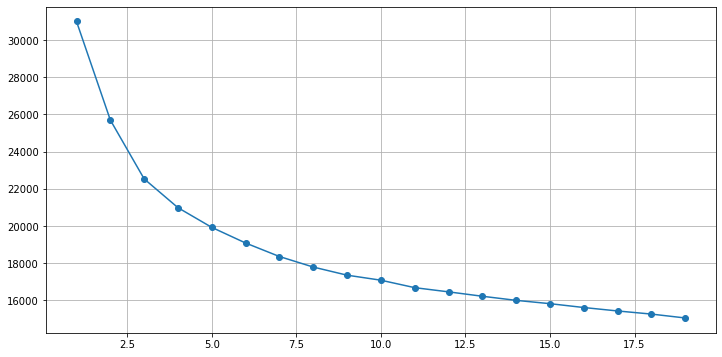

In [65]:
# allow plots to appear in the notebook
%matplotlib inline
import matplotlib.pyplot as plt
plt.figure(figsize=(12,6))

plt.plot( clusters_df.num_clusters, clusters_df.cluster_errors, marker = "o" )

### Note:
- The elbow diagram shows that the gain in explained variance reduces significantly from 3 to 4. So, optimal number of clusters could either 3 or 4. 
- The actual number of clusters chosen can be finally based on business context and convenience of dealing with number of segments or clusters.